# Task

**Обнаружить самолет на фотографии, т.е. обвести его bounding box**

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization, ZeroPadding2D, Add, UpSampling2D, Concatenate, Lambda, LeakyReLU # Стандартные слои Keras
from tensorflow.keras.regularizers import l2 # Регуляризатор l2
from tensorflow.keras.optimizers import Adam # Оптимизатор Adam
from tensorflow.keras.models import Model # Абстрактный класс Model
from PIL import Image, ImageDraw, ImageFont # Модули работы с изображениями
from matplotlib.colors import rgb_to_hsv, hsv_to_rgb # Модули конвертации между RGB и HSV
from google.colab import files # Модуль работы с файловой системой google

import tensorflow.keras.backend as K # бэкенд Keras
import math # Импортируем модуль math
import pandas as pd # Пандас для работы с csv
import tensorflow as tf # TensorFlow
import numpy as np # numpy массивы
import matplotlib.pyplot as plt # графики
import os # модуль работы с файловой системой
import time # модуль работы со временем

import colorsys 

In [ ]:
from google.colab import drive # подключаем гугл драйв диск для загрузки файлов
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
path = '/content/drive/MyDrive/Базы/Airplanes/' # Путь к директории на диске, где находятся изображения
name_classes = ['Airplanes'] # Названия классов
num_classes = len(name_classes) # Количество классов
input_shape = (416, 416) # Размерность входного изображения для модели YOLO

# Массив используемых анкоров (в пикселях). Используетя по 3 анкора на каждый из 3 уровней сеток
# данные значения коррелируются с размерностью входного изображения input_shape
anchors = np.array([[10, 13], [16, 30], [33, 23], [30, 61], [62, 45], [59, 119], [116, 90], [156, 198], [373, 326]]) 
num_anchors = len(anchors) # Сохраняем количество анкоров

# Model

In [ ]:
'''
Функция создания модели YOLOv3
    Входные параметры:
          inputs - Входной слой модели
          num_sub_anchors - количество анкоров в каждом уровне сеток
'''
def create_YOLOv3(
        inputs,
        num_sub_anchors
        ):
    #--------------------
    # Базовая часть модели YOLOv3
    #--------------------
    
    # Состоит из Conv2D-слоев и Residual-блоков. Residual-блок - это блок использующий информацию из предыдущих слоев.
    # С помощью слоя Add (Суммируется текущий слой и один из предыдущих), что позволяет избежать проблему потери информации
    # Количество resedual блоков и архитектура сети взята из документации YOLOv3
    x = ConvBL (inputs, 32, (3, 3)) # Добавляем каскад из трех слоев (Conv2D, BatchNormalization и Leaky)
    x = resblock (x, 64, 1) # Добавляем 1 resedual-блок с 64 нейронами
    x = resblock (x, 128, 2) # Добавляем 2 resedual-блока с 128 нейронами
    x = resblock (x, 256, 8) # Добавляем 8 resedual-блоков с 256 нейронами
    x = resblock (x, 512, 8) # Добавляем 8 resedual-блоков с 512 нейронами
    x = resblock (x, 1024, 4) # Добавляем 4 resedual-блоков с 1024 нейронами
    base_model = Model(inputs, x) # Создаем базовую часть модели YOLOv3
    
    #--------------------
    # Detection часть модели YOLOv3
    #--------------------
    
    # Выделяем три выхода сети, соответсвующих различным уровням сетки
    
    
    # 13 x 13 (обнаружение больших объектов)
    x = ConvBL(base_model.output, 512, (1, 1))    
    x = ConvBL(x, 1024, (3, 3))
    x = ConvBL(x, 512, (1, 1))
    x = ConvBL(x, 1024, (3, 3))
    x = ConvBL(x, 512, (1, 1))
    
    # Выделяем первый выход модели, соответствующий размерности 13 х 13
    y1 = ConvBL(x, 1024, (3,3))
    y1 = Conv2D(num_sub_anchors * (num_classes + 5), (1, 1), padding = 'same', kernel_regularizer = l2(5e-4)) (y1)
    
    
    # 26x26 (обнаружение средних объектов)
    
    # Размерность текущего выхода сети равна 13 х 13. Необходимо увеличить ее до 26 x 26 и
    # объеденить со 152-ым слоем (размерностью 26 x 26)
    x = ConvBL(x, 256, ( 1, 1)) 
    x = UpSampling2D(2) (x) # Увеличиваем размерность до 26 на 26, использую UpSampling
    x = Concatenate()([x,base_model.layers[152].output])
    
    # Добавляем 5 блоков ConvBL
    x = ConvBL(x, 256, (1, 1))  
    x = ConvBL(x, 512, (3, 3))
    x = ConvBL(x, 256, (1, 1))
    x = ConvBL(x, 512, (3, 3))
    x = ConvBL(x, 256, (1, 1))
    
    # Выделяем второй выход модели, соответствующий размерности 26 х 26
    y2 = ConvBL(x, 512, (3, 3))
    y2 = Conv2D(num_sub_anchors * (num_classes + 5), (1, 1), padding = 'same', kernel_regularizer = l2(5e-4)) (y2)
    
    # 52 x 52 (обнаружение маленьких объектов)
    
    # Размерность текущего выхода сети равна 26 х 26. Необходимо увеличить ее до 52 x 52 и
    # объеденить со 92-ым слоем (размерностью 52 x 52)
    x = ConvBL(x, 128, ( 1, 1)) 
    x = UpSampling2D(2) (x)  # Увеличиваем размерность до 52 на 52, использую UpSampling
    x = Concatenate()([x,base_model.layers[92].output])
    
    # Добавляем 5 блоков ConvBL
    x = ConvBL(x, 128, (1, 1))  
    x = ConvBL(x, 256, (3, 3))
    x = ConvBL(x, 128, (1, 1))
    x = ConvBL(x, 256, (3, 3))
    x = ConvBL(x, 128, (1, 1))
    
    # Выделяем третий выход модели, соответствующий размерности 52 х 52
    y3 = ConvBL(x, 256, (3, 3))
    y3 = Conv2D(num_sub_anchors * (num_classes + 5), (1, 1), padding = 'same', kernel_regularizer = l2(5e-4)) (y3)
    
    return Model(inputs, [y1, y2, y3]) # Возвращаем модель

In [ ]:
''' Функция создания Residual блока.
    Входные параметры:
          inputs - Стартовый слой, к которому добавляется Res-блок
          num_filters - количество нейронов
          num_blocks  - количество блоков 
 '''
def resblock(
        inputs,
        num_filters,
        num_blocks
        ):
    x = ZeroPadding2D(((1, 0), (1, 0)))(inputs) # Увеличиваем размерность на один шаг влево и вверх
    x = ConvBL(x, num_filters, (3, 3), strides=(2, 2)) # Добавляем блок ConvBL
    for i in range(num_blocks): # Пробегаем в цикле num_blocks-раз (суммируя слои с помощью Add())
        y = ConvBL(x, num_filters // 2, (1, 1))
        y = ConvBL(y, num_filters, (3, 3))
        x = Add() ([x, y])
    return x # Возвращаем слой

In [ ]:
''' Функция создания блока Conv2D, BatchNormalization, LeakyRelu
    Входные параметры:
          inputs - Стартовый слой, к которому добавляется Res-блок
          args - массив неименованных параметров
          kwargs  - массив именованных параметров
 '''
def ConvBL(
        inputs,
        *args,
        **kwargs
        ): 
    new_kwargs = {'use_bias': False} # создаем новый массив именованных параметров, добавляя параметр use_bias
    new_kwargs['kernel_regularizer'] = l2(5e-4) # добавляем параметр kernel_regularizerpadding
    new_kwargs['padding'] = 'valid' if kwargs.get('strides') == (2, 2) else 'same' # добавляем параметр  padding
    new_kwargs.update(kwargs) # Добавляем уже имеющиеся в kwargs gfhfvtnhs
    x = Conv2D(*args, **new_kwargs) (inputs) # Добавляем Conv2D слой
    x = BatchNormalization() (x) # Добавляем слой BatchNormalization
    x = LeakyReLU(alpha=0.1) (x) # Добавляем слой LeakyRelu
    return x

In [ ]:
'''
    Функция подсчета IoU
'''
def calc_iou(input1, input2):
    input1 = K.expand_dims(input1, -2) # Добавляем одну размерность
    xy1 = input1[..., :2] # Получаем координаты x,y центра 
    wh1 = input1[..., 2:4] # Получаем значения высоты и ширины
    wh_half1 = wh1 / 2. # Делим значения высоты и ширины пополам
    top_left1 = xy1 - wh_half1 # Получаем значение, соответствующее верхнему левому углу
    right_bottom1 = xy1 + wh_half1 # Получаем значение, соотвествующее правому нижнему углу
    
    input2 = K.expand_dims(input2, 0) # Добавляем одну размерность
    xy2 = input2[..., :2] # Получаем координаты x,y центра 
    wh2 = input2[..., 2:4] # Получаем значения высоты и ширины
    wh_half2 = wh2 / 2. # Делим значения высоты и ширины пополам
    top_left2 = xy2 - wh_half2 # Получаем значение, соответствующее верхнему левому углу
    right_bottom2 = xy2 + wh_half2 # Получаем значение, соотвествующее правому нижнему углу
    
    intersect_mins = K.maximum(top_left1, top_left2) # Берем максимальные координаты из левых верхних углов
    intersect_maxes = K.minimum(right_bottom1, right_bottom2) # Берем Минимальные координаты координаты из правых нижних углов
    intersect_wh = K.maximum(intersect_maxes - intersect_mins, 0.) # Считаем ширину и высоту области пересечения
    intersect_area = intersect_wh[..., 0] * intersect_wh[..., 1] # Считаем площадь области пересечения
    
    area1 = wh1[..., 0] * wh1[..., 1] # Считаем площадь первых элементов
    area2 = wh2[..., 0] * wh2[..., 1] # Считаем площадь вторых элементов
    
    return intersect_area / (area1 + area2 - intersect_area) # Возвращаем IoU
    

# Bounding box defining


**Загружаем веса предобученной модели**

In [ ]:
model_weight = '/content/drive/MyDrive/Модели/YOLOv3__el1000__opt0.00001__ep0_100.h5' # Указываем файл с весами модели
max_boxes = 5 # Максимальное количество ограничивающих рамок на изображении

In [ ]:
model_YOLO = create_YOLOv3(Input(shape=(416, 416, 3)), 9//3) # Создаем модель

In [ ]:
model_YOLO.load_weights(model_weight) # Загружаем посчитанные веса модели
print ('{} загружены.'.format(model_weight))

/content/drive/MyDrive/Модели/YOLOv3__el1000__opt0.00001__ep0_100.h5 загружены.


# Function

In [ ]:
def Bounding_Boxes(image):
  model_image_size = (416,416) # Задаем размер входных данных

  # Изменяем размер картинки под input_shape
  iw, ih = image.size
  w, h = (416, 416)
  scale = min(w / iw, h / ih)
  nw = int(iw * scale)
  nh = int(ih * scale)
  image_for_predict = image.resize((nw, nh), Image.BICUBIC)
  new_image = Image.new('RGB', (416,416), (128, 128, 128))
  new_image.paste(image_for_predict, ((w - nw) // 2, (h - nh) // 2))
  image_for_predict = new_image 
  image_for_predict = np.array(image_for_predict) / 255.

  image_for_predict = image_for_predict.reshape(1, 416, 416, 3)


  predict = model_YOLO.predict(image_for_predict)
  num_layers = len(predict) # Получаем количество сеток
  anchor_mask = [[6,7,8], [3,4,5], [0,1,2]] # Задаем маски для 3 уровней анкоров
  input_shape = np.array(predict[0].shape[1:3]) * 32  # Получаем размер выходного изображения
  image_shape = np.array([image.size[1], image.size[0]]) # Сохраняем размер оригинального изображения


  level_anchor = 0 # Укажем уровень сетки
  num_anchors = len(anchors[anchor_mask[level_anchor]]) # Получаем количество анкоров
  anchors_tensor = np.reshape(anchors[anchor_mask[level_anchor]], (1,1,1,num_anchors,2)) # Выбираем анкоры для нашего уровня сетки и решейпим


  grid_shape = predict[level_anchor].shape[1:3] # Получим размерность сетки
  grid = [] # Массив для финальной сетки
  grid_row = [] # Массив для столбца
  for i in range(grid_shape[0]): # По всем строкам
    for j in range(grid_shape[1]): # По всем столбцам
      grid_row.append([j , i]) # Создаем элемент [j, i]
    grid.append(grid_row) # Добавляем столбец в финальную сетку
    grid_row = [] # Обнуляем данные для столбца
  grid = np.array(grid) # Переводим в numpy
  grid = np.expand_dims(grid, axis=2) # Добавляем размерность


  # Решейпим предикт
  feats = np.reshape(predict[level_anchor], (-1, grid_shape[0], grid_shape[1], num_anchors, num_classes+5))


  # Функция расчета сигмоиды для вектора
  def sigmoid(x): # На вход подаем массив данных
    return 1/(1+np.exp(-x)) # Возвращаем сигмоиду для всех элементов массива


  # Получаем параметры бокса

  # Координаты центра bounding box
  xy_param = feats[..., :2] # Выцепляем 0 и 1 параметры из предикта (соответствуют параметрам смещения центра анкора)
  box_xy = (sigmoid(xy_param) + grid)/grid_shape[::-1] # Получаем координаты центра bounding box

  # Высота и ширна bounding box
  wh_param = feats[..., 2:4] # Выцепляем 2 и 3 параметры из предикта (соответствуют праметрам изменения высоты и ширины анкора)
  box_wh = np.exp(wh_param) * anchors_tensor / input_shape[::-1] # Получаем высоту и ширину bounding box

  # Вероятность наличия объекта в анкоре
  conf_param = feats[..., 4:5] # Выцепляем 4 параметр из предикта (соответствуют вероятности обнаружения объекта)
  box_confidence = sigmoid(conf_param) # Получаем вероятность наличия объекта в bounding box

  # Класс объекта
  class_param = feats[...,5:] # Выцепляем 5+ параметры из предикта (соответствуют вероятностям классов объектов)
  box_class_probs = sigmoid(class_param) # Получаем вероятности классов объектов



  # Получаем параметры бокса

  # Координаты центра bounding box
  xy_param = feats[..., :2] # Выцепляем 0 и 1 параметры из предикта (соответствуют параметрам смещения центра анкора)
  box_xy = (sigmoid(xy_param) + grid)/grid_shape[::-1] # Получаем координаты центра bounding box

  # Высота и ширна bounding box
  wh_param = feats[..., 2:4] # Выцепляем 2 и 3 параметры из предикта (соответствуют праметрам изменения высоты и ширины анкора)
  box_wh = np.exp(wh_param) * anchors_tensor / input_shape[::-1] # Получаем высоту и ширину bounding box

  # Вероятность наличия объекта в анкоре
  conf_param = feats[..., 4:5] # Выцепляем 4 параметр из предикта (соответствуют вероятности обнаружения объекта)
  box_confidence = sigmoid(conf_param) # Получаем вероятность наличия объекта в bounding box

  # Класс объекта
  class_param = feats[...,5:] # Выцепляем 5+ параметры из предикта (соответствуют вероятностям классов объектов)
  box_class_probs = sigmoid(class_param) # Получаем вероятности классов объектов


  # Корректируем ограничивающие рамки (Размер изображения на выходе 416х416)
  # И найденные параметры соответствуют именно этой размерности
  # Необходимо найти координаты bounding box для рамерности исходного изображения
  box_yx = box_xy[..., ::-1].copy()
  box_hw = box_wh[..., ::-1].copy()

  new_shape = np.round(image_shape * np.min(input_shape/image_shape)) # Находим размерность пропорциональную исходной с одной из сторон 416
  offset = (input_shape-new_shape)/2./input_shape # Смотрим на сколько надо сместить в относительных координатах
  scale = input_shape/new_shape  # Находим коэфициент масштабирования
  box_yx = (box_yx - offset) * scale # Смещаем по координатам
  box_hw *= scale # Масштабируем ширину и высоту

  box_mins = box_yx - (box_hw / 2.) # Получаем левые верхние координаты (от середины отнимаем половину ширины и высоты)
  box_maxes = box_yx + (box_hw / 2.) # Получаем правые нижнние координаты (к середине прибавляем половину ширины и высоты)
  _boxes =  np.concatenate([
      box_mins[..., 0:1], # yMin
      box_mins[..., 1:2], # xMin
      box_maxes[..., 0:1], # yMax
      box_maxes[..., 1:2]  # xMax
  ], axis=-1)
  _boxes *= np.concatenate([image_shape, image_shape]) # Переводим из относительных координат в абсолютные


  # Получаем выходные параметры
  _boxes_reshape = np.reshape(_boxes, (-1, 4)) # Решейпим все боксы в один массив
  _box_scores = box_confidence * box_class_probs # Получаем вероятность каждого класса (умноженную на веоятность наличия объекта)
  _box_scores_reshape = np.reshape(_box_scores, (-1, num_classes)) # Решейпим в один массив


  ######################################!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
  mask = _box_scores_reshape >= 0.2 # Берем все объекты, обнаруженные с вероятностью больше 0.7
  print(np.where(mask == True))
  ######################################!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!


  _boxes_out = _boxes_reshape[mask[:,0]]
  _scores_out = _box_scores_reshape[:, 0][mask[:,0]] 
  classes_out = np.ones_like(_scores_out,'int32') * 0


  font = ImageFont.truetype(font=path + 'font.otf',
                      size=np.floor(3e-2 * image.size[1] + 0.5).astype('int32'))
  thickness = (image.size[0] + image.size[1]) // 300


    ############### colors
  hsv_tuples = [(x / len(name_classes), 1., 1.) for x in range(len(name_classes))]
  colors = list(map(lambda x: colorsys.hsv_to_rgb(*x), hsv_tuples))
  colors = list(map(lambda x:(int(x[0]*255), int(x[1]*255), int(x[2]*255)), colors))
  np.random.seed(43)
  np.random.shuffle(colors)
  np.random.seed(None)


  image_pred = image.copy()
  for i, c in reversed(list(enumerate(classes_out))):
    draw = ImageDraw.Draw(image_pred)
    predicted_class = name_classes[c]
    box = _boxes_out[i]
    score = _scores_out[i]

    label = '{} {:.2f}'.format(predicted_class, score)
    label_size = draw.textsize(label, font)

    top, left, bottom, right = box
    top = max(0, np.floor(top + 0.5).astype('int32'))
    left = max(0, np.floor(left + 0.5).astype('int32'))
    bottom = min(image.size[1], np.floor(bottom + 0.5).astype('int32'))
    right = min(image.size[0], np.floor(right + 0.5).astype('int32'))

    if top - label_size[1] >= 0:
        text_origin = np.array([left, top - label_size[1]])
    else:
        text_origin = np.array([left, top + 1])
    
    for i in range(thickness):
        draw.rectangle(
            [left + i, top + i, right - i, bottom - i],
            outline=colors[c])
    draw.rectangle(
        [tuple(text_origin), tuple(text_origin + label_size)],
        fill=colors[c])
    draw.text(text_origin, label, fill=(0, 0, 0), font=font)

  image_pred.save('new_image.jpg')
  BounBoxImg = Image.open('new_image.jpg')

  plt.imshow(image_pred)

  return BounBoxImg

# Detection

(array([137, 215, 254]), array([0, 0, 0]))


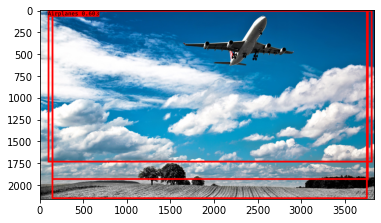

In [ ]:
image = Image.open('/content/drive/MyDrive/Базы/plane_from_net.jpg')
BounBoxImg = Bounding_Boxes(image)

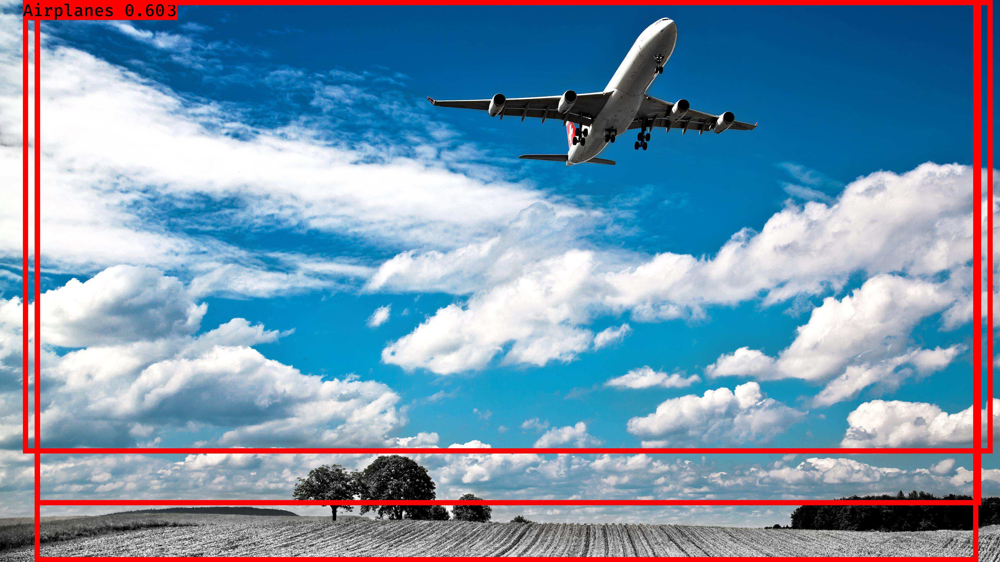

In [ ]:
BounBoxImg

(array([243, 246, 252]), array([0, 0, 0]))


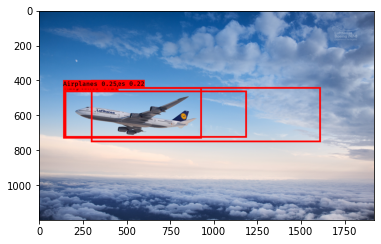

In [ ]:
image = Image.open('/content/drive/MyDrive/Базы/plane_from_net_2.jpg')
BounBoxImg = Bounding_Boxes(image)

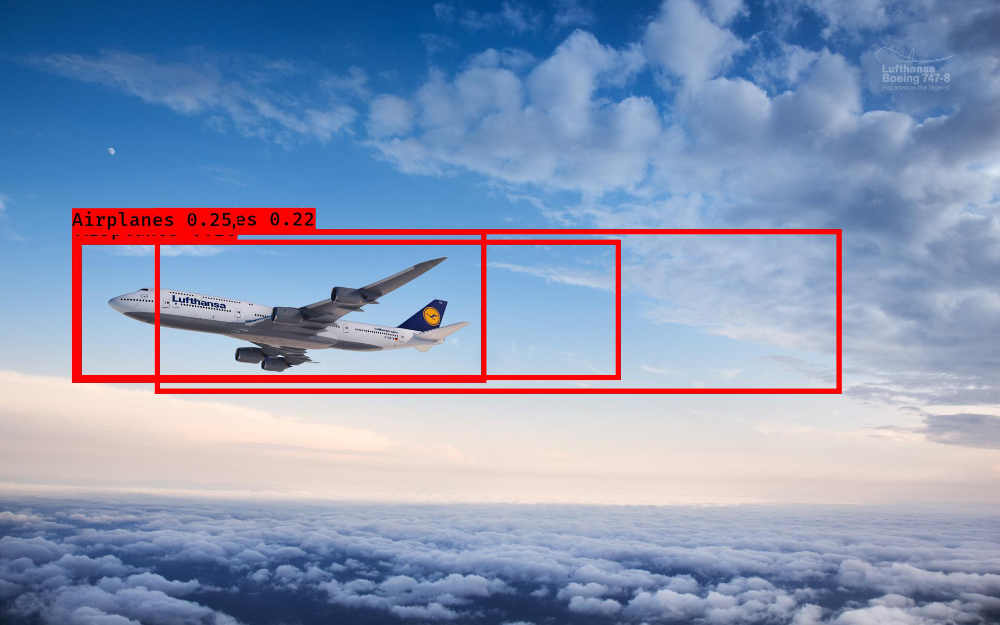

In [ ]:
BounBoxImg

# Вывод
При выполнении данной работы встроил в сеть другие веса (не те что в уроке, а YOLO(1000)_0.001_20.01.23.h5)
Данные веса были гораздо менее оптимальными, что привело к тому что вероятность обнаружения объекта была ниже.
Поэтому я изменил коэффициент вероятности с 0.7 на 0.3, чтобы отобразить результат.
  ######################################!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
  
mask = _box_scores_reshape >= 0.3 # Берем все объекты, обнаруженные с вероятностью больше 0.3

######################################!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!